# FLUJO 3 — Resultados PSBP-FD
1. Lee trazas generadas por MATLAB
2. Diagnósticos de convergencia MCMC
3. Evaluación predictiva **(in-sample)** con media y bandas de credibilidad

## 1. Imports y rutas

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import sys
from pathlib import Path
from scipy.io import loadmat
import pickle

# Módulos del paquete
from model_psbp_fd.functions_models import DataStandardizer
from model_psbp_fd.functions_models import FunctionalRepresentation
from model_psbp_fd.utils import get_project_root
from model_psbp_fd.models.psbp_fd_v2.functions.predict import PSBPPredictor

# Módulos de visualización — solo los que usa este flujo
from model_psbp_fd.graphics import (
    plot_global_components, plot_active_clusters,
    plot_convergence_bj, plot_convergence_pj,
    plot_scatter_theta, plot_functional_comparison,
    plot_fts_comparison,
)

plt.style.use("seaborn-v0_8-darkgrid")
%matplotlib inline

In [2]:
# ── Raíz del proyecto ─────────────────────────────────────────────────────
PROJECT_ROOT = get_project_root()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))
print(f"PROJECT_ROOT : {PROJECT_ROOT}")

# ── Identificación del experimento ───────────────────────────────────────
BASENAME      = "modelo_experimento_1"
TT            = 1
EXPERIMENT_ID = f"{BASENAME}_{TT}"
print(f"Experiment ID : {EXPERIMENT_ID}")
# La semilla NO se declara aquí: se lee de hyperparameters.json (§2),
# única fuente de verdad del contrato Python ↔ MATLAB.

PROJECT_ROOT : C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1
Experiment ID : modelo_experimento_1_1


In [3]:
# ── Construcción de rutas ─────────────────────────────────────────────────
_REPORT_DIR   = PROJECT_ROOT / "reports"   / "simulaciones" / EXPERIMENT_ID
_ARTEFACT_DIR = PROJECT_ROOT / "artefact"  / "simulaciones" / EXPERIMENT_ID

PATHS = {
    "raw":          PROJECT_ROOT / "data" / "simulaciones" / "raw"       / EXPERIMENT_ID,
    "functional":   PROJECT_ROOT / "data" / "simulaciones" / "processed" / "functional" / EXPERIMENT_ID,
    "predict":      PROJECT_ROOT / "data" / "simulaciones" / "processed" / "predict"    / EXPERIMENT_ID,
    "out_report":   _REPORT_DIR,
    "out_artefact": _ARTEFACT_DIR,
}
for name, path in PATHS.items():
    path.mkdir(parents=True, exist_ok=True)
    print(f"  {name:12s} → {path}")

  raw          → C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\data\simulaciones\raw\modelo_experimento_1_1
  functional   → C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\data\simulaciones\processed\functional\modelo_experimento_1_1
  predict      → C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\data\simulaciones\processed\predict\modelo_experimento_1_1
  out_report   → C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\reports\simulaciones\modelo_experimento_1_1
  out_artefact → C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\artefact\simulaciones\modelo_experimento_1_1


## 2. Lectura de datasets funcionales, manifest FPCA e hiperparámetros
Cargamos los datasets AR(p) generados por el pipeline de preprocesamiento
(`04_01_simulaciones`), el manifest con `component_idx` y `n_lags`, el contrato
de hiperparámetros compartido con MATLAB y la representación funcional ajustada.

In [4]:
# ── Manifest ─────────────────────────────────────────────────────────────
manifest_path = PATHS["functional"] / "datasets_manifest.json"
assert manifest_path.exists(), f"No se encontró: {manifest_path}"
with open(manifest_path) as f:
    manifest = json.load(f)

n_lags        = manifest["n_lags"]
COMPONENT_IDX = manifest["component_idx"]      # lista base-0
n_components  = len(COMPONENT_IDX)
cov_names     = manifest["cov_names"]

# Contrato de escala: los datasets deben provenir del pipeline con
# scores estandarizados (04_01 §4.0). Si no, hay que regenerar los artefactos.
scores_scale = manifest.get("scores_scale", "raw")
assert scores_scale == "standardized_zscore_ddof0", (
    f"manifest['scores_scale']={scores_scale!r}: los datasets no usan scores "
    "estandarizados. Re-ejecuta 04_01_simulaciones (pipeline actualizado)."
)

print(f"n_components  : {n_components}")
print(f"n_lags        : {n_lags}")
print(f"COMPONENT_IDX : {COMPONENT_IDX}")
print(f"cov_names     : {cov_names}")
print(f"scores_scale  : {scores_scale}")

n_components  : 5
n_lags        : 3
COMPONENT_IDX : [0, 1, 2, 3, 4]
cov_names     : ['fpc_1_lag1', 'fpc_2_lag1', 'fpc_3_lag1', 'fpc_4_lag1', 'fpc_5_lag1', 'fpc_1_lag2', 'fpc_2_lag2', 'fpc_3_lag2', 'fpc_4_lag2', 'fpc_5_lag2', 'fpc_1_lag3', 'fpc_2_lag3', 'fpc_3_lag3', 'fpc_4_lag3', 'fpc_5_lag3']
scores_scale  : standardized_zscore_ddof0


In [5]:
# ── Hiperparámetros y contrato Python ↔ MATLAB ───────────────────────────
hp_path = PATHS["out_artefact"] / "hyperparameters.json"
assert hp_path.exists(), f"No se encontró: {hp_path} — ejecuta 04_01_simulaciones."
with open(hp_path) as f:
    hp_json = json.load(f)

N_ITER    = int(hp_json["n_iter"])          # cadenas por componente (lo fija 04_01)
SEED_BASE = int(hp_json["seed_base"])
MCMC_CFG  = hp_json["mcmc_config"]

# Coherencia de escala entre manifest e hiperparámetros
assert hp_json["scores_scale"] == scores_scale, (
    f"scores_scale discrepa: manifest={scores_scale!r}, "
    f"hyperparameters={hp_json['scores_scale']!r}."
)
# Coherencia de nº de componentes entre ambos artefactos
assert len(hp_json["hyperparams_list"]) == n_components, (
    f"n_components discrepa: manifest={n_components}, "
    f"hyperparameters={len(hp_json['hyperparams_list'])}."
)

print(f"N_ITER      : {N_ITER}  (cadenas por componente)")
print(f"SEED_BASE   : {SEED_BASE}  · esquema: {hp_json['seed_scheme']}")
print(f"MCMC config : {MCMC_CFG}")

N_ITER      : 3  (cadenas por componente)
SEED_BASE   : 41232  · esquema: SEED_BASE + tt*9973 + k*31
MCMC config : {'nsim': 2000, 'burn': 500, 'N': 20, 'M': 50}


In [6]:
# ── Cargar datasets AR(p) en dfs[k] ─────────────────────────────────────
# dfs[k] es el DataFrame del componente k (respuesta + predictores rezagados)
dfs = {}
for k in range(n_components):
    fpc_idx = COMPONENT_IDX[k] + 1          # base-1
    fpath   = PATHS["functional"] / f"dataset_fpc_{fpc_idx}.csv"
    assert fpath.exists(), f"No se encontró: {fpath}"
    dfs[k]  = pd.read_csv(fpath)
    print(f"  FPC {fpc_idx}  shape={dfs[k].shape}  cols={list(dfs[k].columns)}")

  FPC 1  shape=(147, 16)  cols=['fpc_1', 'fpc_1_lag1', 'fpc_2_lag1', 'fpc_3_lag1', 'fpc_4_lag1', 'fpc_5_lag1', 'fpc_1_lag2', 'fpc_2_lag2', 'fpc_3_lag2', 'fpc_4_lag2', 'fpc_5_lag2', 'fpc_1_lag3', 'fpc_2_lag3', 'fpc_3_lag3', 'fpc_4_lag3', 'fpc_5_lag3']
  FPC 2  shape=(147, 16)  cols=['fpc_2', 'fpc_1_lag1', 'fpc_2_lag1', 'fpc_3_lag1', 'fpc_4_lag1', 'fpc_5_lag1', 'fpc_1_lag2', 'fpc_2_lag2', 'fpc_3_lag2', 'fpc_4_lag2', 'fpc_5_lag2', 'fpc_1_lag3', 'fpc_2_lag3', 'fpc_3_lag3', 'fpc_4_lag3', 'fpc_5_lag3']
  FPC 3  shape=(147, 16)  cols=['fpc_3', 'fpc_1_lag1', 'fpc_2_lag1', 'fpc_3_lag1', 'fpc_4_lag1', 'fpc_5_lag1', 'fpc_1_lag2', 'fpc_2_lag2', 'fpc_3_lag2', 'fpc_4_lag2', 'fpc_5_lag2', 'fpc_1_lag3', 'fpc_2_lag3', 'fpc_3_lag3', 'fpc_4_lag3', 'fpc_5_lag3']
  FPC 4  shape=(147, 16)  cols=['fpc_4', 'fpc_1_lag1', 'fpc_2_lag1', 'fpc_3_lag1', 'fpc_4_lag1', 'fpc_5_lag1', 'fpc_1_lag2', 'fpc_2_lag2', 'fpc_3_lag2', 'fpc_4_lag2', 'fpc_5_lag2', 'fpc_1_lag3', 'fpc_2_lag3', 'fpc_3_lag3', 'fpc_4_lag3', 'fpc_5_lag

In [7]:
# ── Cargar representación funcional ajustada (B-spline) ──────────────────────
# Serializada como .pkl en el notebook 04_01_simulaciones
fr_path = PATHS["functional"] / "functional_representation.pkl"
if fr_path.exists():
    with open(fr_path, "rb") as _f:
        fr = pickle.load(_f)
    print(f"✓ FunctionalRepresentation cargada: método={fr.method}, K={fr.n_basis}")
else:
    print(f"⚠ No se encontró functional_representation.pkl en {PATHS['functional']}")
    fr = None

# ── Cargar grilla del dominio ─────────────────────────────────────────────────
grid_path = PATHS["functional"] / "domain_grid.npy"
assert grid_path.exists(), f"No se encontró {grid_path} — ejecuta primero 04_01_simulaciones"
domain_grid = np.load(grid_path)
print(f"✓ Grilla cargada: {domain_grid.shape}")

# ── Cargar curvas (escala ORIGINAL) ───────────────────────────────────────────
# Las curvas no se estandarizan; la referencia de comparación es X_curves
# (crudas). La estandarización vive en los scores.
X_curves_path = PATHS["functional"] / "X_curves.npy"
assert X_curves_path.exists(), (
    f"No se encontró {X_curves_path} — re-ejecuta 04_01_simulaciones "
    "(pipeline: crudo → B-spline → FPCA → scores estandarizados)."
)
X_curves = np.load(X_curves_path)
print(f"✓ X_curves cargado: {X_curves.shape}  (T, G) — escala original")

# ── Cargar estandarizador de SCORES ───────────────────────────────────────────
# Necesario para des-estandarizar las predicciones del PSBP antes de
# reconstruir curvas.
scores_std_dir = PATHS["functional"] / "scores_standardizer"
assert (scores_std_dir / "standardizer_metadata.json").exists(), (
    f"No se encontró el estandarizador de scores en {scores_std_dir} — "
    "re-ejecuta 04_01_simulaciones §4.0."
)
scores_standardizer = DataStandardizer.load(scores_std_dir)

# ── Cargar artefactos FPCA desde disco ────────────────────────────────────────
# Psi_grid : (G, M) eigenfunciones en grilla   →  fpca_eigenfunctions.csv
# mu_grid  : (G,)   media funcional en grilla   →  fpca_mean.csv
# W        : (K, K) matriz de Gram L²           →  fpca_gram_W.csv
# B        : (K, M) coeficientes eigenfunciones →  fpca_coef_B.csv
# mu_theta : (K,)   media de coeficientes       →  fpca_mu_theta.csv
# THETA    : (T, K) coeficientes B-spline       →  theta.csv
# Phi      : (G, K) base B-spline en grilla     →  basis_phi.csv
# SCORES   : (T, M) scores FPCA observados (escala ORIGINAL) → fpca_scores.csv
fpca_files = {
    "Psi_grid": PATHS["functional"] / "fpca_eigenfunctions.csv",
    "mu_grid":  PATHS["functional"] / "fpca_mean.csv",
    "W":        PATHS["functional"] / "fpca_gram_W.csv",
    "B":        PATHS["functional"] / "fpca_coef_B.csv",
    "mu_theta": PATHS["functional"] / "fpca_mu_theta.csv",
    "THETA":    PATHS["functional"] / "theta.csv",
    "Phi":      PATHS["functional"] / "basis_phi.csv",
    "SCORES":   PATHS["functional"] / "fpca_scores.csv",
}

# Matrices que SIEMPRE deben ser 2D aunque tengan una sola columna
# (np.loadtxt colapsa a 1D con una columna: con M_fpca=1 rompería aguas abajo)
_esperado_2d = {"Psi_grid", "W", "B", "THETA", "Phi", "SCORES"}

fpca_arrays = {}
fpca_available = True
for name, path in fpca_files.items():
    if path.exists():
        arr = np.loadtxt(path, delimiter=",")
        if name in _esperado_2d and arr.ndim == 1:
            arr = arr.reshape(-1, 1)
        fpca_arrays[name] = arr
        print(f"✓ {name:10s}: {arr.shape}")
    else:
        print(f"⚠ No se encontró {path.name} — ejecuta primero 04_01_simulaciones")
        fpca_available = False

if fpca_available:
    Psi_grid = fpca_arrays["Psi_grid"]   # (G, M)
    mu_grid  = fpca_arrays["mu_grid"]    # (G,)
    W        = fpca_arrays["W"]          # (K, K)
    B        = fpca_arrays["B"]          # (K, M)
    mu_theta = fpca_arrays["mu_theta"]   # (K,)
    THETA    = fpca_arrays["THETA"]      # (T, K)
    Phi      = fpca_arrays["Phi"]        # (G, K)
    SCORES   = fpca_arrays["SCORES"]     # (T, M) — escala original (var = λ_m)

fpca_meta_path = PATHS["functional"] / "fpca_meta.json"
if fpca_meta_path.exists():
    with open(fpca_meta_path) as _f:
        fpca_meta = json.load(_f)
    M_fpca = int(fpca_meta["M"])
    K      = int(fpca_meta["K"])
    _ve    = fpca_meta.get("var_explained")
    print(f"✓ fpca_meta: M={M_fpca}, K={K}" +
          (f", var_explained={_ve:.4%}" if _ve is not None else ""))
else:
    fpca_meta = {}
    M_fpca    = Psi_grid.shape[1] if fpca_available else None
    K         = THETA.shape[1]    if fpca_available else None

# ── Operadores de reconstrucción ──────────────────────────────────────────────
# Ambos operan sobre scores en escala ORIGINAL (des-estandarizar antes).
#
# (1) FPCA → curva en grilla:  X̂(t) = μ(t) + Ξ · Ψᵀ
def reconstruct_from_scores(S_hat):
    """scores FPCA escala original (T, M) → curvas en grilla (T, G)."""
    S_hat = np.atleast_2d(np.asarray(S_hat, dtype=float))
    return mu_grid[None, :] + S_hat @ Psi_grid.T

# (2) scores FPCA → coeficientes B-spline:
#     Por ortonormalidad en métrica L² (Bᵀ W B = I), la inversa correcta del
#     truncamiento FPCA es Bᵀ:  Θ̂ = μ_θ + Ξ Bᵀ, y entonces
#     Θ̂ Φᵀ ≡ μ + Ξ Ψᵀ exactamente (Ψ = Φ B).
def scores_to_theta(S_hat):
    """scores FPCA escala original (T, M) → coeficientes B-spline (T, K)."""
    S_hat = np.atleast_2d(np.asarray(S_hat, dtype=float))
    return S_hat @ B.T + mu_theta[None, :]

# ── Sanidad: ambos operadores deben producir LA MISMA curva ───────────────────
if fpca_available:
    _ortho_err = np.abs(B.T @ W @ B - np.eye(M_fpca)).max()
    _S_chk  = SCORES[:5]
    _eq_err = np.abs(reconstruct_from_scores(_S_chk)
                     - scores_to_theta(_S_chk) @ Phi.T).max()
    print(f"[sanidad] max|BᵀWB − I|                  : {_ortho_err:.2e}  (≈ 0)")
    print(f"[sanidad] max|FPCA−reconstr. vía B-spline|: {_eq_err:.2e}  (≈ 0)")
    assert _eq_err < 1e-8, (
        "Las dos rutas de reconstrucción divergen: revisa B, W, mu_theta, Phi."
    )

✓ FunctionalRepresentation cargada: método=bspline, K=7
✓ Grilla cargada: (50,)
✓ X_curves cargado: (150, 50)  (T, G) — escala original
✓ Standardizer cargado desde: C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\data\simulaciones\processed\functional\modelo_experimento_1_1\scores_standardizer
✓ Psi_grid  : (50, 5)
✓ mu_grid   : (50,)
✓ W         : (7, 7)
✓ B         : (7, 5)
✓ mu_theta  : (7,)
✓ THETA     : (150, 7)
✓ Phi       : (50, 7)
✓ SCORES    : (150, 5)
✓ fpca_meta: M=5, K=7, var_explained=98.8102%
[sanidad] max|BᵀWB − I|                  : 1.55e-15  (≈ 0)
[sanidad] max|FPCA−reconstr. vía B-spline|: 1.78e-15  (≈ 0)


## 3. Lectura de trazas MATLAB
Configuramos el patrón de nombre, definimos el loader y ensamblamos
`models_chains[k][c]` con el adaptador `MatlabTraceModel`.

In [8]:
# ── Configuración de trazas ───────────────────────────────────────────────
TRACE_DIR = PATHS["out_artefact"]
# N_ITER ya viene de hyperparameters.json (§2): no se redefine aquí.

# Patrón de nombre: chain_fpc_<fpc_idx>_iter<tt>.mat
def trace_path(fpc_idx: int, tt: int) -> Path:
    return TRACE_DIR / f"chain_fpc_{fpc_idx}_iter{tt:02d}.mat"

print(f"TRACE_DIR : {TRACE_DIR}")
print(f"N_ITER    : {N_ITER}  (cadenas por componente)")
print(f"Ejemplo   : {trace_path(1, 1).name}")

TRACE_DIR : C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\artefact\simulaciones\modelo_experimento_1_1
N_ITER    : 3  (cadenas por componente)
Ejemplo   : chain_fpc_1_iter01.mat


In [9]:
# ── Loader: .mat → dict de trazas ────────────────────────────────────────
def load_trace_mat(path: Path) -> tuple:
    """
    Carga un archivo .mat generado por psbp_train y devuelve
    (traces_dict, burn, feature_names_list).
    """
    m      = loadmat(str(path))
    keys2d = ["betajhout", "beta0hout", "tauhout", "alphahout",
              "psijhout", "Gammajhout", "gammajhout", "pijout",
              "wjout", "osumout", "inEout"]
    traces = {k: np.asarray(m[k], dtype=np.float64) for k in keys2d}
    for k in ["muout", "N1out", "Nout"]:
        traces[k] = np.asarray(m[k], dtype=np.float64).ravel()
    burn  = int(np.asarray(m["burn"]).ravel()[0])
    feat  = str(np.atleast_1d(m["feature_names"]).ravel()[0]).split(",")
    return traces, burn, feat


# ── Adaptador: trazas MATLAB → objeto compatible con funciones de visualización
class MatlabTraceModel:
    """
    Expone .traces y .feature_names_ tal como los esperan las funciones
    plot_* del paquete, y delega predicción en PSBPPredictor.
    """
    def __init__(self, traces: dict, burn: int, feature_names: list):
        self.traces         = traces
        self.feature_names_ = list(feature_names)
        self.burn           = int(burn)
        self.n_features_    = int(traces["betajhout"].shape[2])
        # PSBPPredictor es agnóstico a la escala (no desestandariza)
        self.predictor_     = PSBPPredictor(traces=traces, burn=burn)

    def _design(self, df: pd.DataFrame) -> np.ndarray:
        """Construye matriz de diseño con intercepto desde un DataFrame."""
        Xp = np.asarray(df.iloc[:, 1:], dtype=float)
        return np.hstack([np.ones((Xp.shape[0], 1)), Xp])

    def predict(self, df: pd.DataFrame, return_std: bool = False):
        return self.predictor_.predict(self._design(df), return_std=return_std)

    def inclusion_probs(self, as_series: bool = False):
        incl = self.predictor_.inclusion_probs()
        if as_series:
            return pd.Series(incl, index=self.feature_names_, name="inclusion_prob")
        return incl

    def rmse(self, df: pd.DataFrame, y_obs=None) -> float:
        if y_obs is None:
            y_obs = np.asarray(df.iloc[:, 0], dtype=float)
        return self.predictor_.rmse(self._design(df), y_obs)

In [10]:
# ── Ensamblar models_chains[k][c] ────────────────────────────────────────
# Carga estricta: si falta un archivo se aborta con la lista completa de
# faltantes (omitirlos en silencio desalinearía componentes aguas abajo).
missing = []
for k in range(n_components):
    fpc_idx = COMPONENT_IDX[k] + 1
    for c in range(N_ITER):
        p_ = trace_path(fpc_idx, c + 1)
        if not p_.exists():
            missing.append(p_.name)
assert not missing, (
    f"Faltan {len(missing)} trazas en {TRACE_DIR}: {missing}. "
    "Ejecuta psbp_fd_iteracion.m antes de continuar."
)

models_chains = {k: {} for k in range(n_components)}
_meta_seen = set()

for k in range(n_components):
    fpc_idx = COMPONENT_IDX[k] + 1
    for c in range(N_ITER):
        tt   = c + 1
        path = trace_path(fpc_idx, tt)
        traces, burn, feat = load_trace_mat(path)

        # Verificar consistencia con las columnas del dataset
        expected = list(dfs[k].columns[1:])
        assert feat == expected, (
            f"[k={k} tt={tt}] feature_names del .mat ≠ columnas del dataset:\n"
            f"  mat={feat}\n  dfs={expected}\n"
            "Las trazas no corresponden a los datasets actuales; regenera."
        )

        models_chains[k][c] = MatlabTraceModel(traces, burn, feat)
        nsim = traces["betajhout"].shape[0]
        N    = traces["betajhout"].shape[1]
        _meta_seen.add((nsim, N, burn))
        print(f"  FPC {fpc_idx}  iter{tt:02d}  ← {path.name}  "
              f"(p={len(feat)}, N={N}, nsim={nsim}, burn={burn})")

# Homogeneidad de configuración entre archivos
assert len(_meta_seen) == 1, (
    f"Configuraciones MCMC heterogéneas entre trazas: {_meta_seen}. "
    "Mezclar nsim/N/burn distintos invalida el análisis conjunto."
)
nsim, N, BURN = next(iter(_meta_seen))
n_chains_loaded = N_ITER

# Cruce de contrato: las trazas deben corresponder a la config declarada
# en hyperparameters.json (detecta trazas viejas vs hiperparámetros nuevos).
assert (nsim, N, BURN) == (MCMC_CFG["nsim"], MCMC_CFG["N"], MCMC_CFG["burn"]), (
    f"Trazas (nsim={nsim}, N={N}, burn={BURN}) ≠ hyperparameters.json "
    f"({MCMC_CFG}). Regenera las cadenas con psbp_fd_iteracion.m."
)

TRACE_META = {
    "nsim":     int(nsim),
    "burn":     int(BURN),
    "N":        int(N),
    "n_chains": n_chains_loaded,
    "source":   "matlab",
}
print(f"\n✓ models_chains listo: {len(models_chains)} componente(s) × "
      f"{n_chains_loaded} cadena(s)  BURN={BURN}")

  FPC 1  iter01  ← chain_fpc_1_iter01.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 1  iter02  ← chain_fpc_1_iter02.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 1  iter03  ← chain_fpc_1_iter03.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 2  iter01  ← chain_fpc_2_iter01.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 2  iter02  ← chain_fpc_2_iter02.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 2  iter03  ← chain_fpc_2_iter03.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 3  iter01  ← chain_fpc_3_iter01.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 3  iter02  ← chain_fpc_3_iter02.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 3  iter03  ← chain_fpc_3_iter03.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 4  iter01  ← chain_fpc_4_iter01.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 4  iter02  ← chain_fpc_4_iter02.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 4  iter03  ← chain_fpc_4_iter03.mat  (p=15, N=20, nsim=2000, burn=500)
  FPC 5  iter01  ← chain_fpc_5_iter01.mat  (p=15, N=20, nsim=2000, burn=500)

## 4. Diagnósticos de convergencia MCMC

| Estadístico | Referencia | Lectura |
|---|---|---|
| ACF(lag) | autocorrelación residual | cerca de 0 ⇒ buena mezcla |
| ESS | Geyer (1992) | ESS ≳ 400 ideal |
| Geweke z | test z entre segmentos | \|z\| < 2 ⇒ no rechazo |
| Gelman-Rubin R̂ | Brooks-Gelman (1998) | R̂ < 1.1 ⇒ convergencia |

### 4.1 Componentes globales (μ, N₁, α, τ, β₀, p_j)

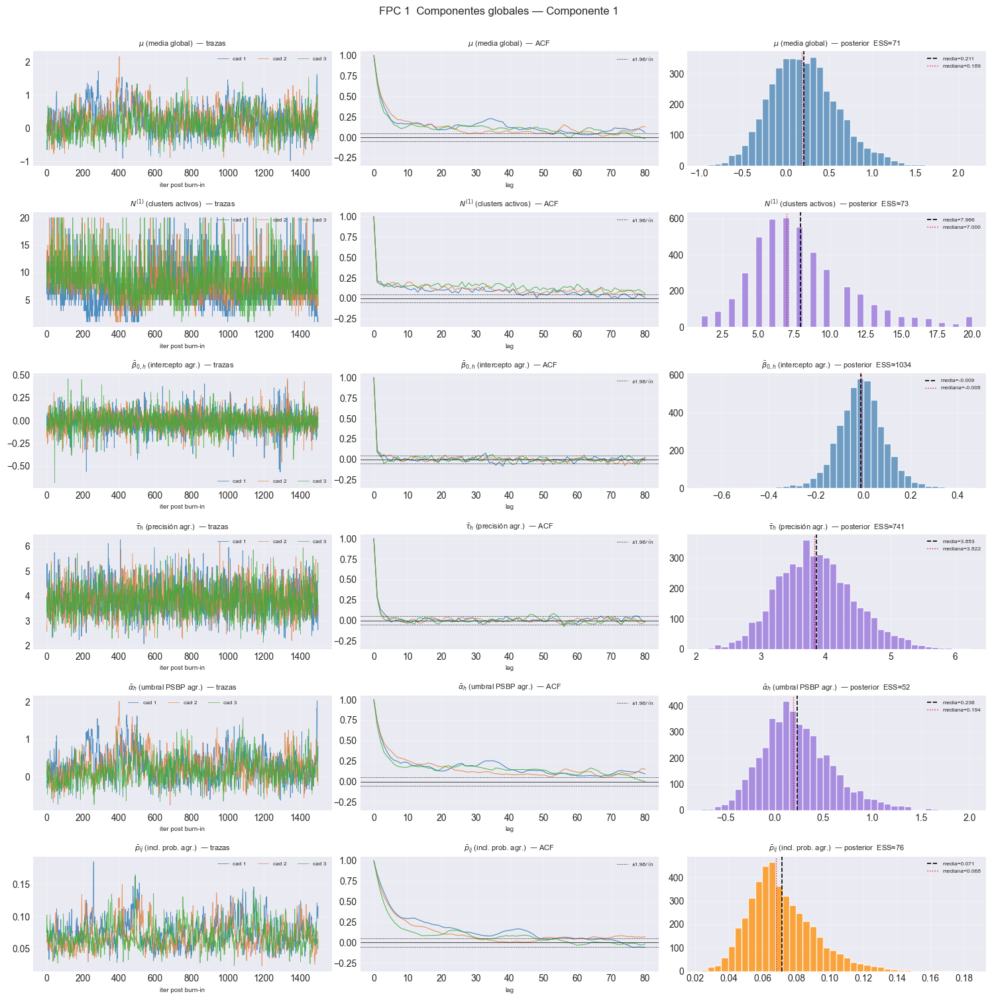

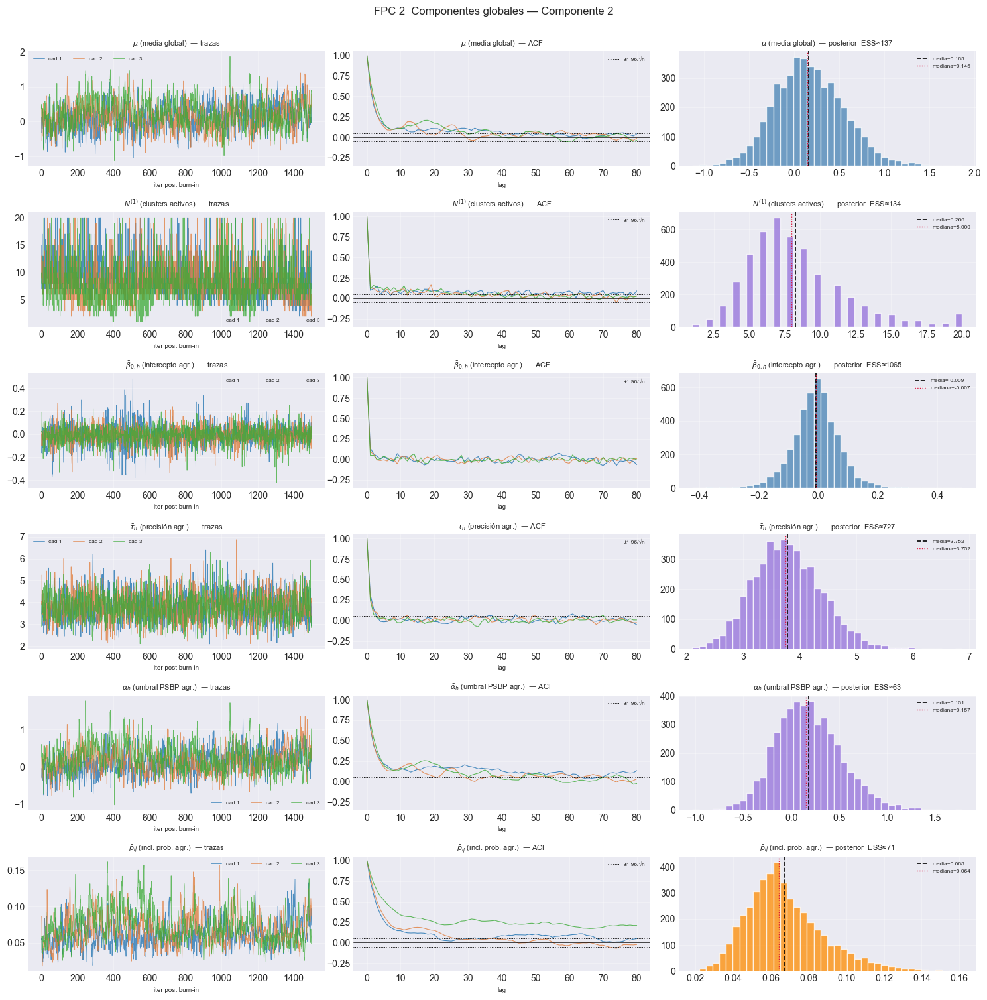

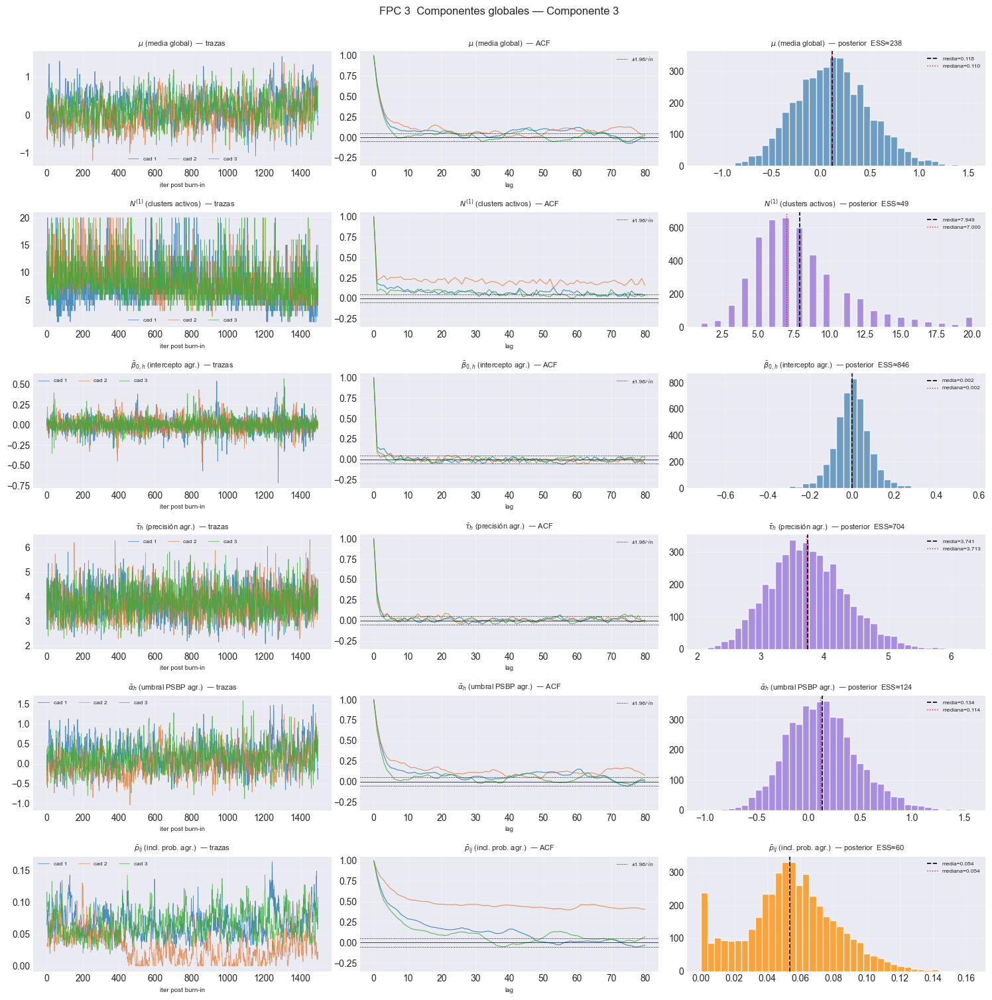

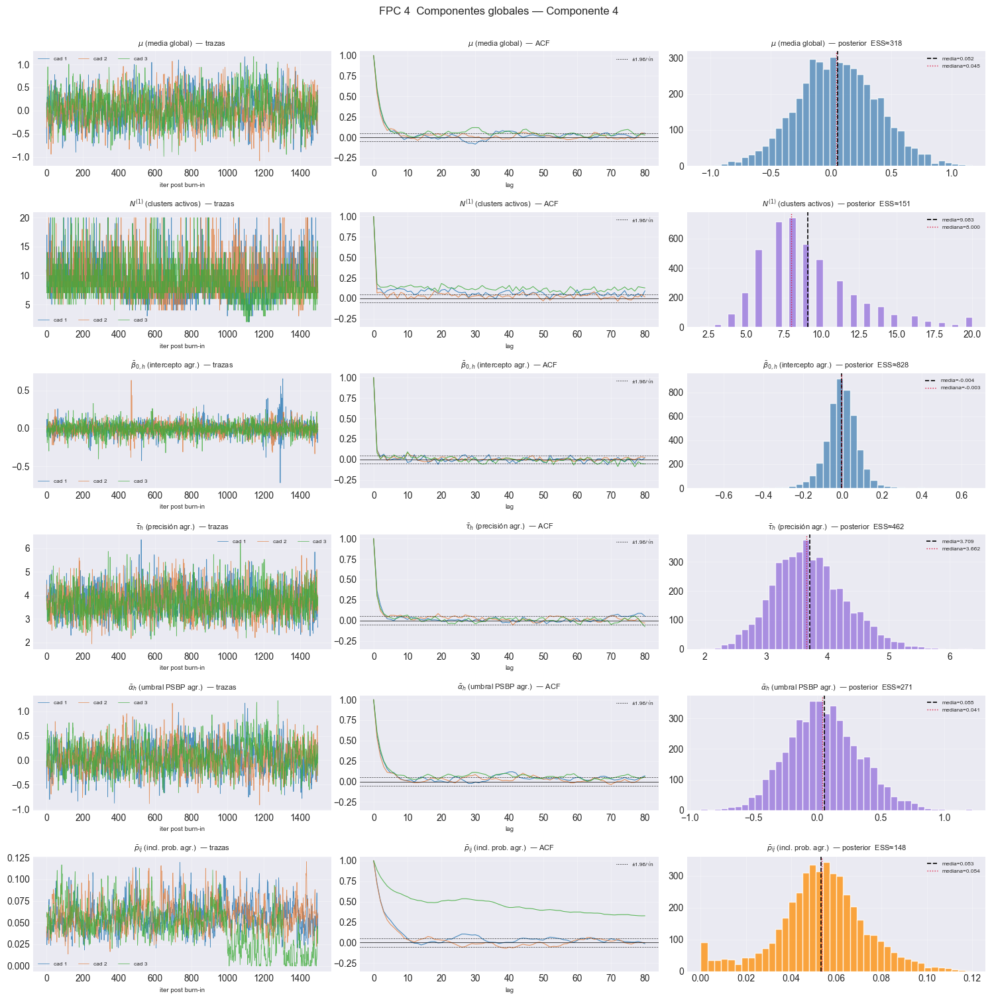

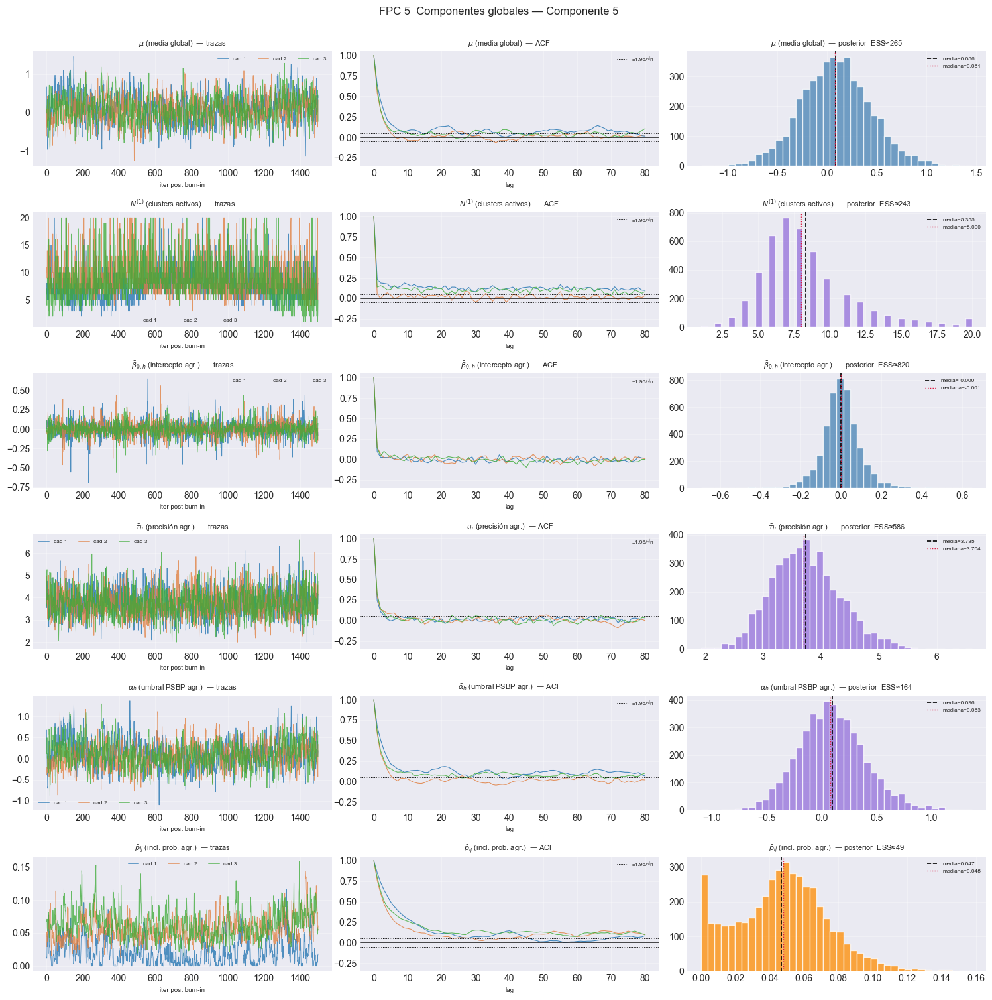

In [11]:
for k in models_chains:
    fig = plot_global_components(
        models_chains, k, BURN, n_chains_loaded,
        title_prefix = f"FPC {k+1}",
        save_path    = str(PATHS["out_report"] / f"10_global_comp_k{k+1}.png"),
    )
    plt.show()

C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_global_components.py:276: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_global_components.py:278: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")
c:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\.v_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


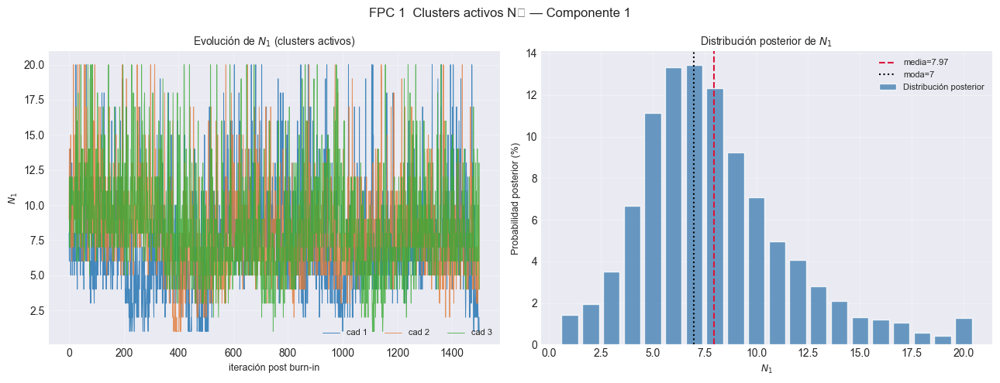

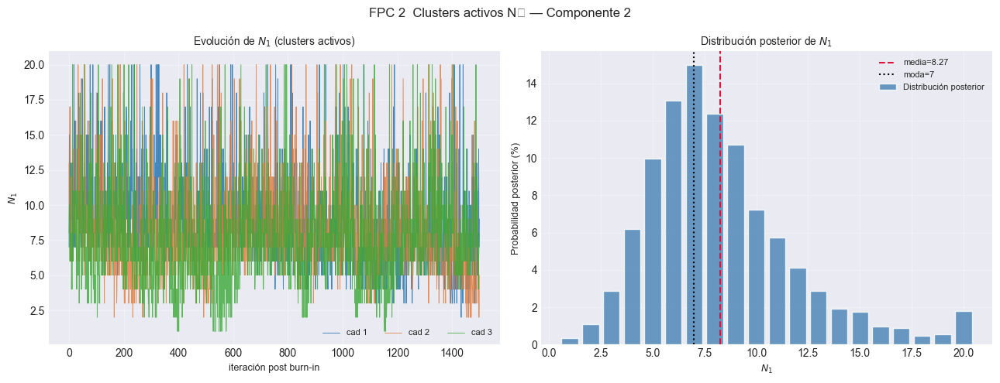

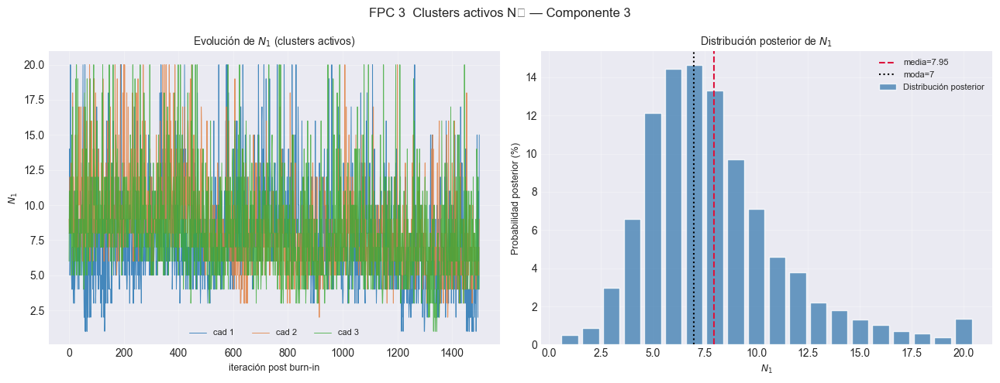

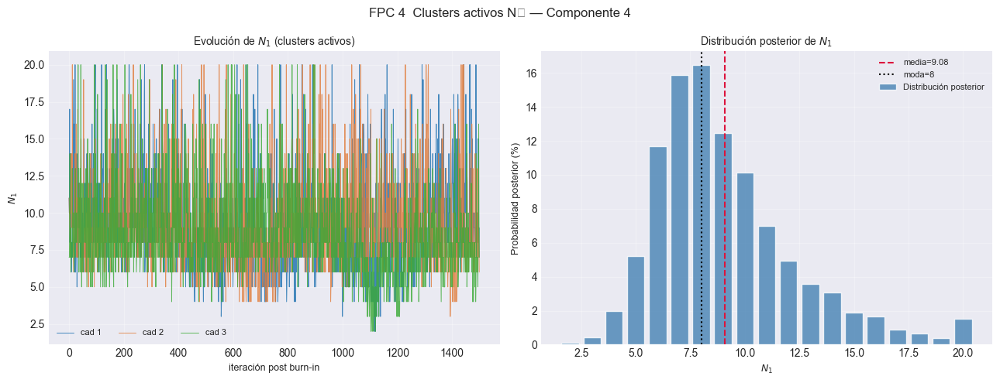

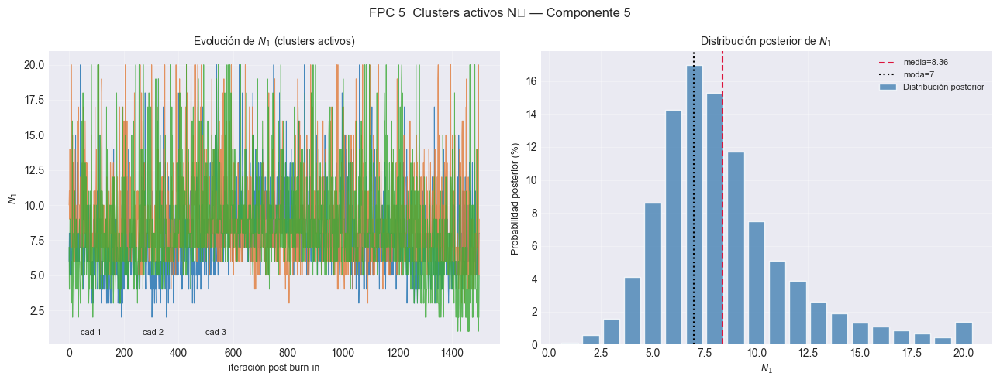

In [12]:
for k in models_chains:
    fig = plot_active_clusters(
        models_chains, k, BURN, n_chains_loaded,
        title_prefix = f"FPC {k+1}",
        save_path    = str(PATHS["out_report"] / f"11_clusters_activos_k{k+1}.png"),
    )
    plt.show()

### 4.2 Convergencia completa (traza | ACF | posterior + métricas)

C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:47: RuntimeWarning: invalid value encountered in divide
  acf_full /= acf_full[0]
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:390: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:390: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:392: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:392: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_i

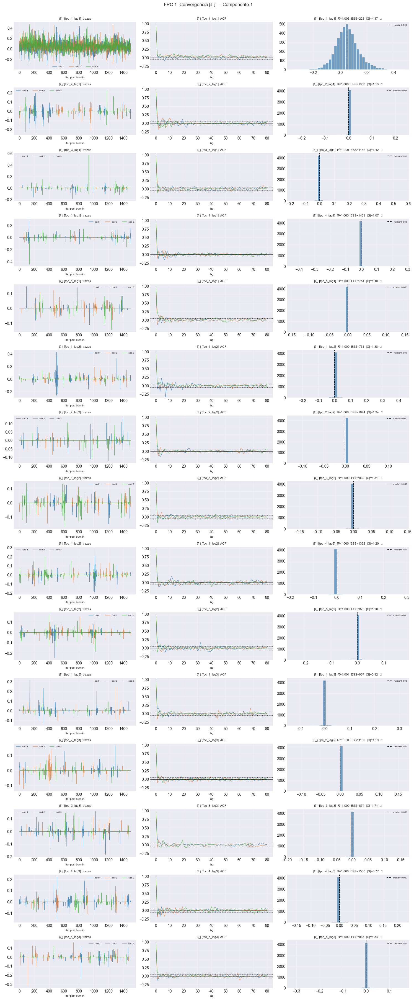

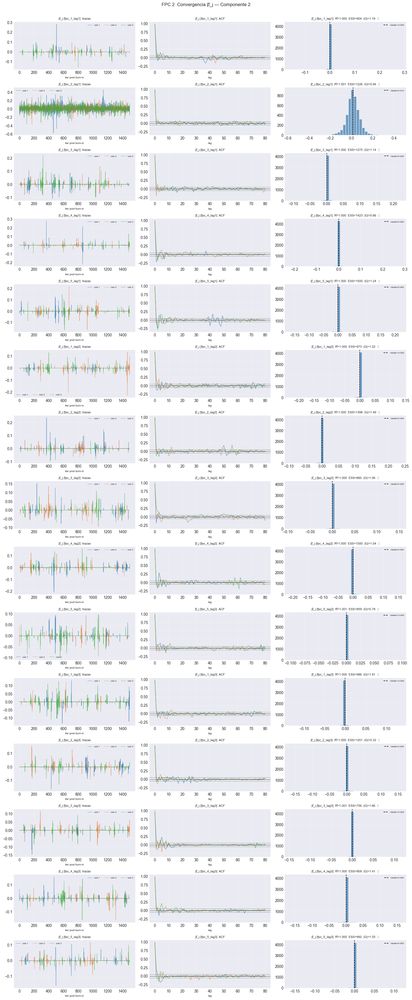

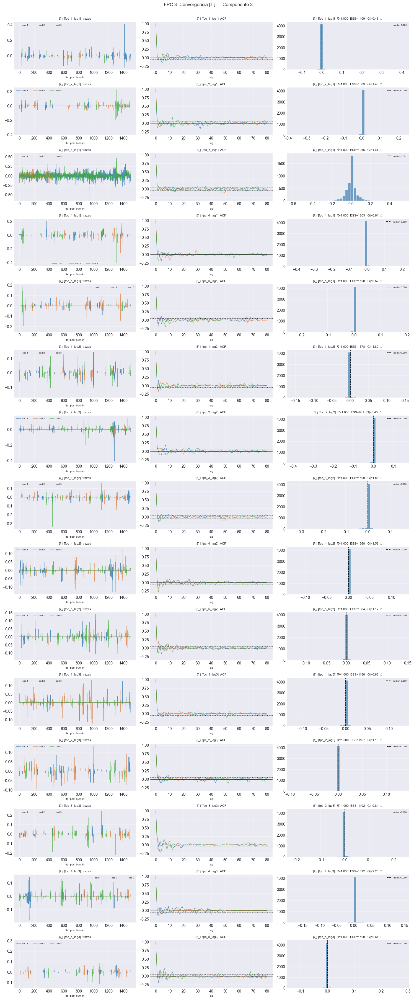

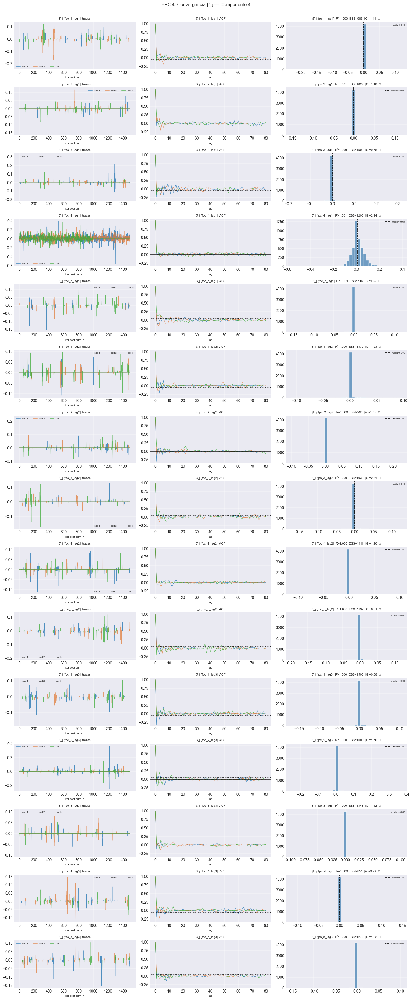

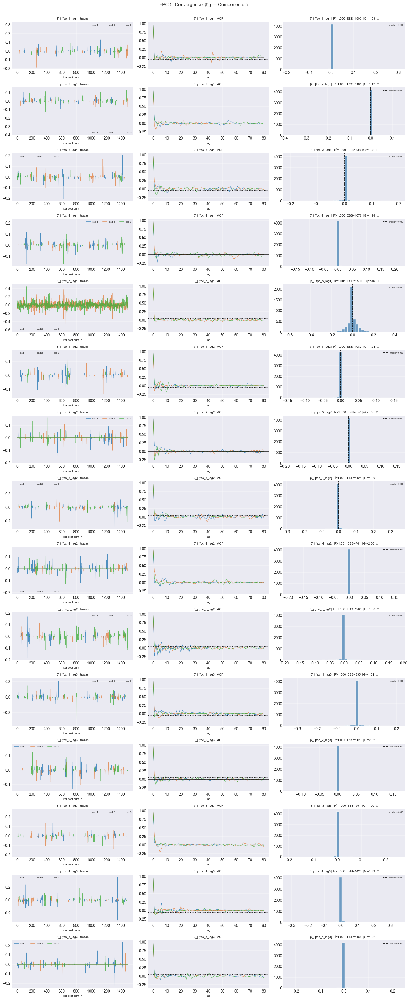

In [13]:
all_diag_bj = {}
for k in models_chains:
    feat = models_chains[k][0].feature_names_
    fig, diag = plot_convergence_bj(
        models_chains, k, BURN, n_chains_loaded,
        feature_names = feat,
        title_prefix  = f"FPC {k+1}",
        save_path     = str(PATHS["out_report"] / f"12_convergencia_bj_k{k+1}.png"),
    )
    all_diag_bj[k] = diag
    plt.show()

C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:479: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:479: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:481: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")
C:\Users\56jua\Desktop\git_tesis\bayesian_non_parametrics-1\model_psbp_fd\graphics\viz_traces.py:481: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  fig.savefig(save_path, dpi=150, bbox_inches="tight")


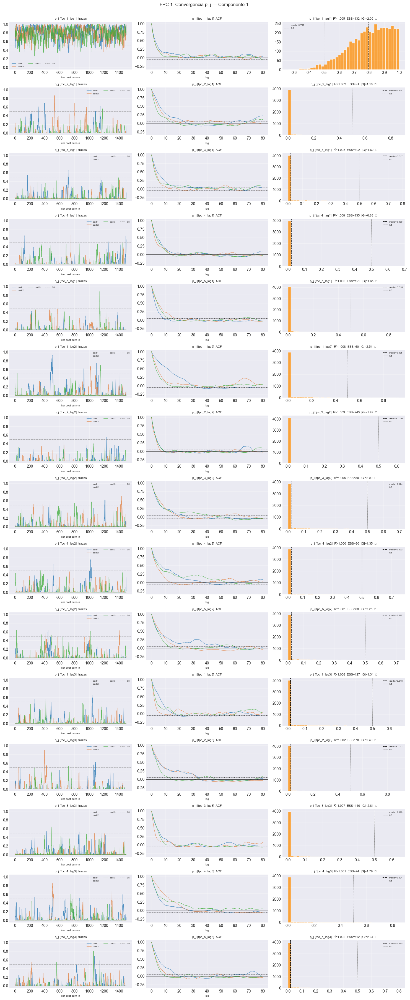

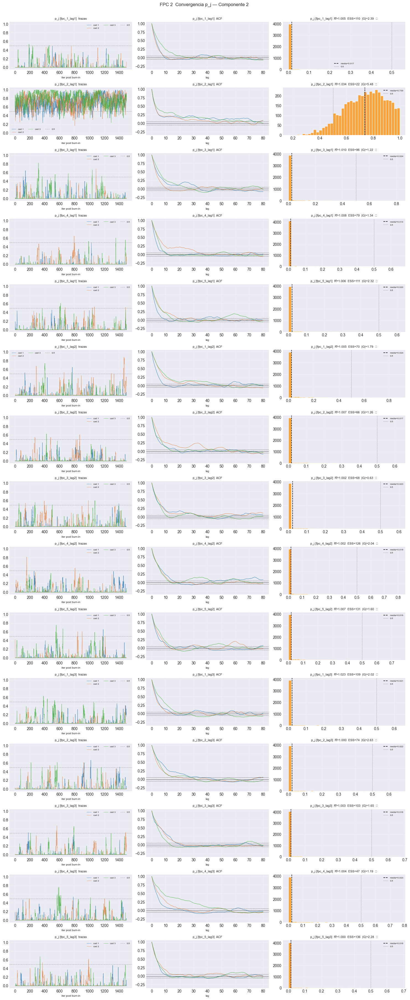

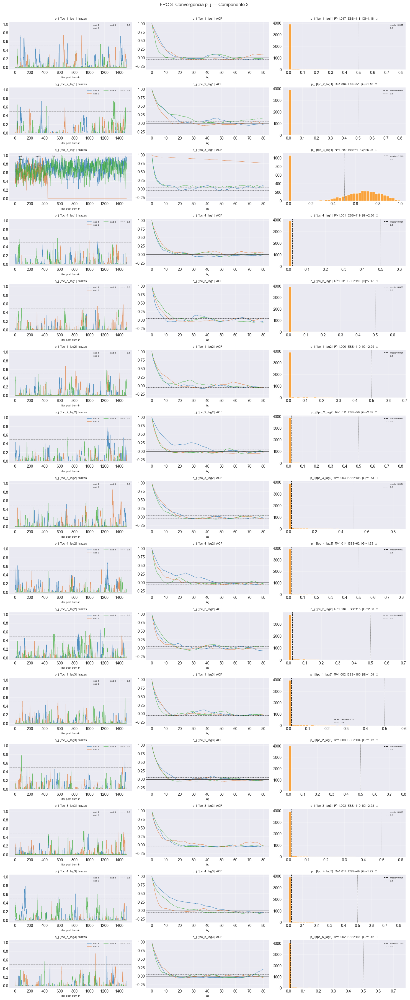

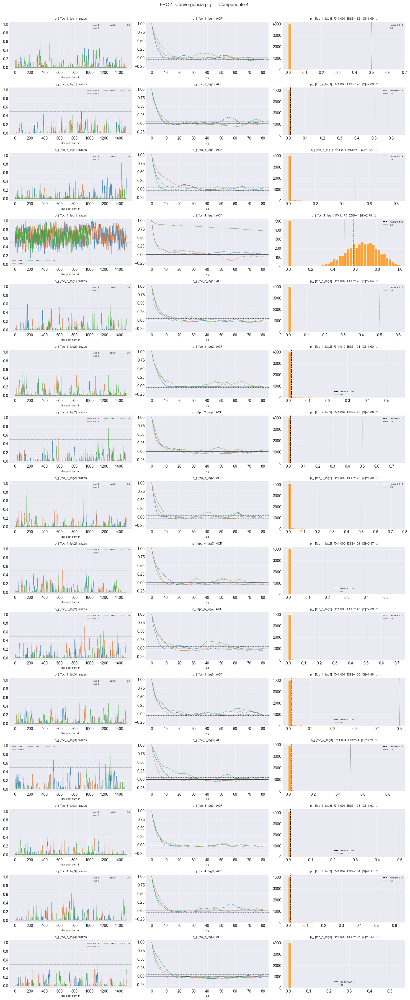

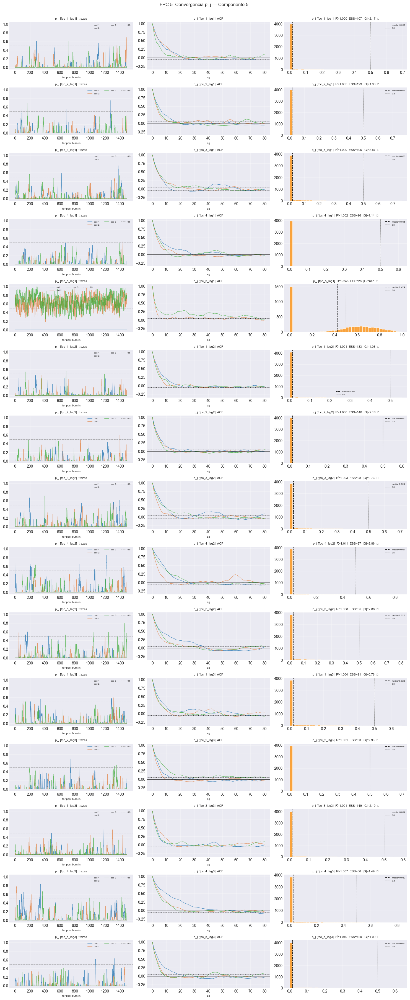

In [14]:
all_diag_pj = {}
for k in models_chains:
    feat = models_chains[k][0].feature_names_
    fig, diag = plot_convergence_pj(
        models_chains, k, BURN, n_chains_loaded,
        feature_names = feat,
        title_prefix  = f"FPC {k+1}",
        save_path     = str(PATHS["out_report"] / f"13_convergencia_pj_k{k+1}.png"),
    )
    all_diag_pj[k] = diag
    plt.show()

In [15]:
# ── Tabla resumen de diagnósticos + persistencia ─────────────────────────
diag_records = []
for k in models_chains:
    for rec in all_diag_bj.get(k, []):
        diag_records.append({"componente": k+1, "param": "beta_j", **rec})
    for rec in all_diag_pj.get(k, []):
        diag_records.append({"componente": k+1, "param": "p_j",    **rec})

diag_df = pd.DataFrame(diag_records)
if not diag_df.empty:
    # Persistencia: tabla fuente para el capítulo de resultados
    diag_df.to_csv(PATHS["out_report"] / "30_diagnosticos_mcmc.csv", index=False)
    print(f"[out_report] 30_diagnosticos_mcmc.csv  ({len(diag_df)} filas)")
    display(
        diag_df.style
        .format({"ess_min": "{:.1f}", "ess_mean": "{:.1f}",
                 "geweke_max": "{:+.2f}", "rhat": "{:.3f}"})
        .background_gradient(subset=["rhat"],    cmap="RdYlGn_r", vmin=1.0, vmax=1.2)
        .background_gradient(subset=["ess_min"], cmap="RdYlGn",   vmin=0,   vmax=500)
        .map(lambda v: "font-weight:bold;color:#c0392b" if v is False else "",
             subset=["converge"])
        .set_caption("Diagnósticos MCMC por variable")
    )
else:
    print("No hay datos de diagnóstico disponibles.")

[out_report] 30_diagnosticos_mcmc.csv  (150 filas)


,componente,param,variable,ess_min,ess_mean,geweke_max,rhat,converge
0,1,beta_j,fpc_1_lag1,227.9,614.2,+4.37,1.003,False
1,1,beta_j,fpc_2_lag1,1299.6,1407.5,+1.13,1.000,True
2,1,beta_j,fpc_3_lag1,1142.4,1304.9,+1.42,1.000,True
3,1,beta_j,fpc_4_lag1,1439.1,1479.7,+1.07,1.000,True
4,1,beta_j,fpc_5_lag1,750.9,1250.3,+1.10,1.000,True
5,1,beta_j,fpc_1_lag2,731.3,1128.9,+1.38,1.000,True
6,1,beta_j,fpc_2_lag2,1094.1,1364.7,+1.34,1.000,True
7,1,beta_j,fpc_3_lag2,932.4,1310.8,+1.31,1.000,True
8,1,beta_j,fpc_4_lag2,1321.7,1392.0,+1.20,1.000,True
9,1,beta_j,fpc_5_lag2,873.2,1246.4,+1.20,1.000,True


## 5. Evaluación predictiva **(in-sample)**

Las métricas de esta sección se calculan sobre los mismos datos usados para
entrenar (ajuste in-sample, no pronóstico fuera de muestra). Las respuestas
y predicciones están en escala de **scores estandarizados**; para reconstruir
curvas (§5.3–5.4) las predicciones se des-estandarizan con el
`scores_standardizer` persistido por `04_01`.

Además de la media predictiva se calcula la **desviación estándar predictiva**
por observación (mezcla de cadenas), con la que se construyen bandas de
credibilidad aproximadas al 95% (§5.6) y cobertura empírica (§5.7). Las bandas
μ ± 1.96σ son una aproximación de dos momentos: la predictiva del PSBP es una
mezcla, no una gaussiana; los cuantiles exactos quedan para la evaluación
fuera de muestra.

In [16]:
# ── Predicciones por componente (in-sample): media + desviación predictiva ──
# Se agrupan las cadenas: la media posterior agrupada es el promedio de las
# medias por cadena, y la varianza agrupada de la mezcla de cadenas es
#   Var_pool = E_c[σ_c²] + Var_c[μ_c]   (mezcla de igual peso).
eval_results = {}

for k in models_chains:
    df_k  = dfs[k]
    y_obs = np.asarray(df_k.iloc[:, 0], dtype=float)        # escala estandarizada

    chain_ids = sorted(models_chains[k].keys())
    _means, _stds = [], []
    for c in chain_ids:
        mu_c, sd_c = models_chains[k][c].predict(df_k, return_std=True)
        _means.append(np.asarray(mu_c, dtype=float))
        _stds.append(np.asarray(sd_c, dtype=float))
    y_hat_chains = np.column_stack(_means)                   # (T_eff, n_chains)
    y_std_chains = np.column_stack(_stds)                    # (T_eff, n_chains)

    y_hat = y_hat_chains.mean(axis=1)                        # posterior agrupado
    y_var = ((y_std_chains ** 2).mean(axis=1)
             + ((y_hat_chains - y_hat[:, None]) ** 2).mean(axis=1))
    y_std = np.sqrt(y_var)

    incl_chains = pd.concat(
        [models_chains[k][c].inclusion_probs(as_series=True) for c in chain_ids],
        axis=1,
    )
    incl_named = incl_chains.mean(axis=1).rename("inclusion_prob")

    rmse_k = float(np.sqrt(np.mean((y_hat - y_obs) ** 2)))
    cov95  = float(np.mean(np.abs(y_obs - y_hat) <= 1.96 * y_std))
    ancho  = float(np.mean(2 * 1.96 * y_std))

    # ── Check de contrato MATLAB ↔ Python: inEout vs PSBPPredictor ──────────
    # MATLAB guarda E[y|x] in-sample por iteración (inEout). Su media post
    # burn-in debe aproximar la predicción del predictor por cadena.
    for c in chain_ids:
        m_c      = models_chains[k][c]
        inE_mean = m_c.traces["inEout"][m_c.burn:].mean(axis=0)   # (T_eff,)
        y_hat_c  = y_hat_chains[:, c]
        diff     = float(np.abs(inE_mean - y_hat_c).max())
        corr     = float(np.corrcoef(inE_mean, y_hat_c)[0, 1])
        flag     = "" if corr > 0.999 else "  ⚠ revisar contrato sampler↔predictor"
        print(f"  FPC {COMPONENT_IDX[k]+1} cad{c+1}: "
              f"|inEout−predict|max={diff:.4f}  corr={corr:.5f}{flag}")

    eval_results[k] = {
        "y_obs":        y_obs,            # scores ESTANDARIZADOS
        "y_hat":        y_hat,            # media predictiva (pooled)
        "y_std":        y_std,            # desv. predictiva (pooled)
        "y_hat_chains": y_hat_chains,
        "incl_named":   incl_named,
        "rmse":         rmse_k,           # escala estandarizada, in-sample
        "cov95":        cov95,            # cobertura empírica banda ±1.96σ
        "ancho95":      ancho,            # ancho medio de la banda
    }
    print(f"  FPC {COMPONENT_IDX[k]+1}  RMSE={rmse_k:.4f}  "
          f"Cob95={cov95:.3f}  ancho95={ancho:.3f}")

print("\n✓ eval_results construido (posterior agrupado sobre "
      f"{n_chains_loaded} cadenas)")

  FPC 1 cad1: |inEout−predict|max=0.0004  corr=1.00000
  FPC 1 cad2: |inEout−predict|max=0.0006  corr=1.00000
  FPC 1 cad3: |inEout−predict|max=0.0004  corr=1.00000
  FPC 1  RMSE=0.7571  Cob95=0.245  ancho95=0.402
  FPC 2 cad1: |inEout−predict|max=0.0004  corr=1.00000
  FPC 2 cad2: |inEout−predict|max=0.0002  corr=1.00000
  FPC 2 cad3: |inEout−predict|max=0.0001  corr=1.00000
  FPC 2  RMSE=0.9638  Cob95=0.238  ancho95=0.493
  FPC 3 cad1: |inEout−predict|max=0.0000  corr=1.00000
  FPC 3 cad2: |inEout−predict|max=0.0000  corr=1.00000
  FPC 3 cad3: |inEout−predict|max=0.0000  corr=1.00000
  FPC 3  RMSE=1.0090  Cob95=0.177  ancho95=0.354
  FPC 4 cad1: |inEout−predict|max=0.0002  corr=1.00000
  FPC 4 cad2: |inEout−predict|max=0.0001  corr=1.00000
  FPC 4 cad3: |inEout−predict|max=0.0001  corr=1.00000
  FPC 4  RMSE=0.9946  Cob95=0.177  ancho95=0.434
  FPC 5 cad1: |inEout−predict|max=0.0001  corr=1.00000
  FPC 5 cad2: |inEout−predict|max=0.0001  corr=1.00000
  FPC 5 cad3: |inEout−predict|max=

### 5.1 Scatter ξ observado vs ξ predicho (scores FPCA estandarizados, in-sample)

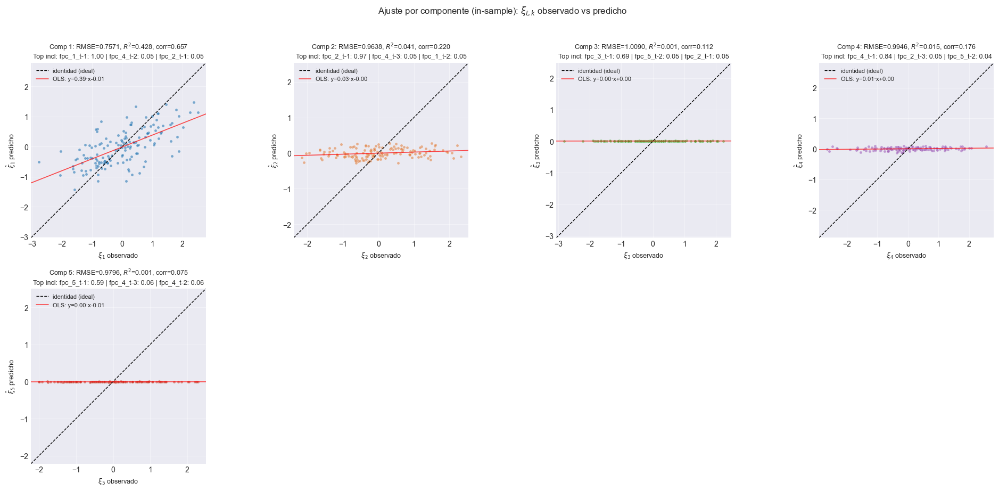

In [17]:
fig = plot_scatter_theta(
    eval_results,
    n_components = len(models_chains),
    save_path    = str(PATHS["out_report"] / "20_scatter_scores.png"),
)
plt.show()

### 5.2 Probabilidades de inclusión por variable

In [18]:
# Tabla de inclusión por componente y variable
incl_df = pd.DataFrame({
    f"FPC {COMPONENT_IDX[k]+1}": eval_results[k]["incl_named"]
    for k in models_chains
})
display(
    incl_df.style
    .background_gradient(cmap="RdYlGn", vmin=0, vmax=1)
    .format("{:.3f}")
    .set_caption("P(γ_j = 1 | data) — Probabilidades de inclusión por variable y componente")
)

,FPC 1,FPC 2,FPC 3,FPC 4,FPC 5
fpc_1_lag1,1.000,0.037,0.045,0.034,0.039
fpc_2_lag1,0.048,0.973,0.047,0.029,0.034
fpc_3_lag1,0.032,0.044,0.685,0.035,0.038
fpc_4_lag1,0.042,0.027,0.040,0.843,0.040
fpc_5_lag1,0.029,0.041,0.042,0.033,0.587
fpc_1_lag2,0.044,0.047,0.043,0.034,0.029
fpc_2_lag2,0.020,0.034,0.040,0.034,0.030
fpc_3_lag2,0.045,0.043,0.047,0.024,0.052
fpc_4_lag2,0.049,0.040,0.039,0.034,0.055
fpc_5_lag2,0.042,0.039,0.053,0.037,0.052


### 5.3 Reconstrucción funcional

Las predicciones (scores estandarizados) se **des-estandarizan** y se
reconstruyen curvas por las dos rutas equivalentes — FPCA
($\hat X = \mu + \hat\Xi\,\Psi^\top$) y B-spline
($\hat\Theta = \mu_\theta + \hat\Xi\,B^\top$, luego
$\hat X = \hat\Theta\,\Phi^\top$) — que coinciden exactamente por
ortonormalidad en métrica $L^2$ ($B^\top W B = I$). La comparación es
contra las curvas originales `X_curves`.

[sanidad] max|ruta B-spline − ruta FPCA| : 1.78e-15  (≈ 0)
RMSE representación (truncamiento FPCA) : 0.492886
RMSE predicción (modelo PSBP)           : 1.119163
MISE L² predicción                      : 1.251086
RMSE funcional (√MISE)                  : 1.118519
── Métricas de reconstrucción (escala de X_true) ──
  RMSE representación : 0.492886   NRMSE=0.250
  RMSE modelo         : 1.005276   NRMSE=0.510
  RMSE total          : 1.119163   NRMSE=0.567
  Ratio modelo/total  : 0.898


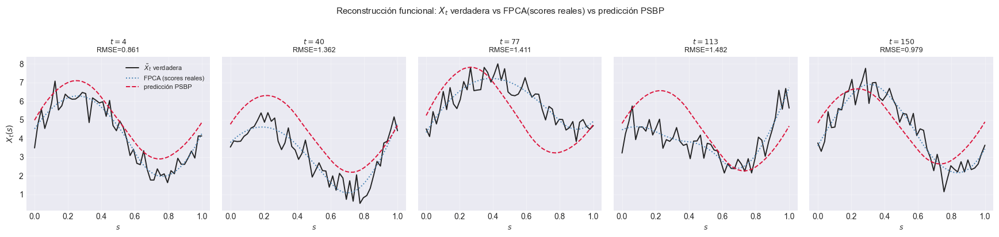


── Métricas de reconstrucción (in-sample) ──────────────────
  rmse_repr            : 0.492886
  rmse_model           : 1.005276
  rmse_total           : 1.119163
  nrmse_repr           : 0.249923
  nrmse_model          : 0.509737
  nrmse_total          : 0.567484


In [19]:
if fpca_available and fr is not None:
    # ── Scores verdaderos en ambas escalas ────────────────────────────────────
    SCORES_STD_true = scores_standardizer.transform(SCORES)   # (T, M) estandarizados

    # ── Matrices de scores efectivos (T_eff, M) ───────────────────────────────
    # Predicciones en escala ESTANDARIZADA (la del modelo); componentes no
    # modeladas (si las hubiera) conservan el score observado.
    SCORES_STD_true_eff = SCORES_STD_true[n_lags:]            # (T_eff, M)
    SCORES_STD_pred_eff = SCORES_STD_true_eff.copy()
    for k, idx in enumerate(COMPONENT_IDX):
        SCORES_STD_pred_eff[:, idx] = eval_results[k]["y_hat"]

    # ── Des-estandarizar ANTES de reconstruir curvas ──────────────────────────
    SCORES_true_eff = SCORES[n_lags:]                                       # (T_eff, M) escala original
    SCORES_pred_eff = scores_standardizer.inverse_transform(SCORES_STD_pred_eff)

    # ── Reconstrucción en grilla (ruta FPCA) ──────────────────────────────────
    X_fpca_obs  = reconstruct_from_scores(SCORES_true_eff)    # (T_eff, G)
    X_fpca_pred = reconstruct_from_scores(SCORES_pred_eff)    # (T_eff, G)
    X_true_eff  = X_curves[n_lags:, :]                        # (T_eff, G) original alineada

    # ── Ruta B-spline (vía Θ̂ = μ_θ + Ξ̂ Bᵀ) — debe coincidir con la FPCA ──────
    THETA_pred_eff = scores_to_theta(SCORES_pred_eff)         # (T_eff, K)
    X_bspline_pred = THETA_pred_eff @ Phi.T                   # (T_eff, G)
    _eq = float(np.abs(X_bspline_pred - X_fpca_pred).max())
    print(f"[sanidad] max|ruta B-spline − ruta FPCA| : {_eq:.2e}  (≈ 0)")
    assert _eq < 1e-8, "Las rutas de reconstrucción divergen: revisa Bᵀ."

    # ── Métricas (in-sample, escala original de las curvas) ──────────────────
    rmse_fpca_repr = float(np.sqrt(np.mean((X_true_eff - X_fpca_obs ) ** 2)))
    rmse_fpca_pred = float(np.sqrt(np.mean((X_true_eff - X_fpca_pred) ** 2)))
    mise_pred      = float(np.trapezoid(
        np.mean((X_fpca_pred - X_true_eff) ** 2, axis=0), domain_grid
    ))
    print(f"RMSE representación (truncamiento FPCA) : {rmse_fpca_repr:.6f}")
    print(f"RMSE predicción (modelo PSBP)           : {rmse_fpca_pred:.6f}")
    print(f"MISE L² predicción                      : {mise_pred:.6f}")
    print(f"RMSE funcional (√MISE)                  : {np.sqrt(mise_pred):.6f}")

    # ── Visualización: plot_functional_comparison ─────────────────────────────
    if COMPONENT_IDX == list(range(M_fpca)):
        class _FPCAProxy:
            """Proxy con .reconstruct(S) = inversa FPCA (scores escala original)."""
            def reconstruct(self, S):
                return reconstruct_from_scores(S)

        # eval_results está en escala estandarizada; el proxy reconstruye
        # desde escala original → se pasa una vista des-estandarizada.
        eval_results_orig = {
            k: {
                "y_obs": SCORES_true_eff[:, idx],
                "y_hat": SCORES_pred_eff[:, idx],
                "incl_named": eval_results[k]["incl_named"],
            }
            for k, idx in enumerate(COMPONENT_IDX)
        }

        fig, metrics = plot_functional_comparison(
            eval_results  = eval_results_orig,
            fr            = _FPCAProxy(),
            domain_grid   = domain_grid,
            X_true        = X_curves,
            n_components  = n_components,
            n_lags        = n_lags,
            n_snapshots   = 5,
            repr_label    = "FPCA (scores reales)",
            title         = (r"Reconstrucción funcional: $X_t$ verdadera vs "
                             r"FPCA(scores reales) vs predicción PSBP"),
            save_path     = str(PATHS["out_report"] / "21_reconstruccion_funcional_fpca.png"),
        )
        plt.show()

        print("\n── Métricas de reconstrucción (in-sample) ──────────────────")
        for key, val in metrics.items():
            print(f"  {key:20s} : {val:.6f}")
    else:
        print("⚠ COMPONENT_IDX no cubre las M componentes en orden FPCA; "
              "se omite plot_functional_comparison (apilado por columnas inválido).")
else:
    print("⚠ fpca_available=False o fr=None — omitiendo reconstrucción funcional.")

### 5.4 Serie de tiempo funcional: predicha vs verdadera

Capa B-spline real (`fr`): empírica | repr. B-spline | pred. PSBP
des-estandarizada, alineada con offset `n_lags`. *(La versión con capa FPCA se
eliminó: su capa de predicción es idéntica a esta —lo garantiza el assert de
§5.3— y su capa de representación ya está en la figura 21.)*

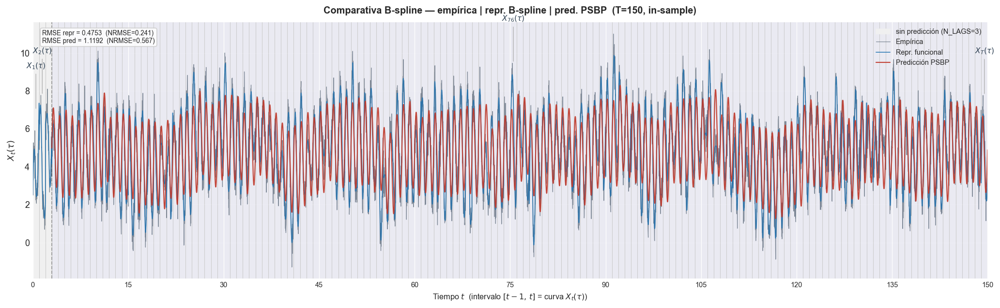

── Métricas B-spline (in-sample) ───────────────────────────────────
  rmse_repr            : 0.475262
  rmse_pred            : 1.119163
  nrmse_repr           : 0.240987
  nrmse_pred           : 0.567484


In [20]:
if fpca_available and fr is not None:
    # X_bspline_pred : (T_eff, G) construida en §5.3 desde scores predichos
    # des-estandarizados (idéntica a X_fpca_pred por el assert de §5.3).
    fig_bspline, metrics_bspline = plot_fts_comparison(
        X           = X_curves,        # (T, G) empírica completa (escala original)
        grid        = domain_grid,
        fr          = fr,              # FunctionalRepresentation B-spline real
        X_pred_repr = X_bspline_pred,  # (T_eff, G)
        n_lags      = n_lags,
        title       = (
            "Comparativa B-spline — empírica | repr. B-spline | pred. PSBP"
            f"  (T={X_curves.shape[0]}, in-sample)"
        ),
        save_path   = str(PATHS["out_report"] / "22_fts_comparacion_bspline.png"),
    )
    plt.show()

    print("── Métricas B-spline (in-sample) ───────────────────────────────────")
    for key, val in metrics_bspline.items():
        print(f"  {key:20s} : {val:.6f}")
else:
    print("⚠ fpca_available=False o fr=None — omitiendo serie funcional.")

### 5.5 Scatter en espacio de coeficientes B-spline (θ)

Complementa §5.1 (que vive en espacio de scores ξ). Primero la vista agrupada
(dos referencias), luego el desglose **por coeficiente**, que muestra dónde
pega el truncamiento FPCA y dónde el error de modelo.

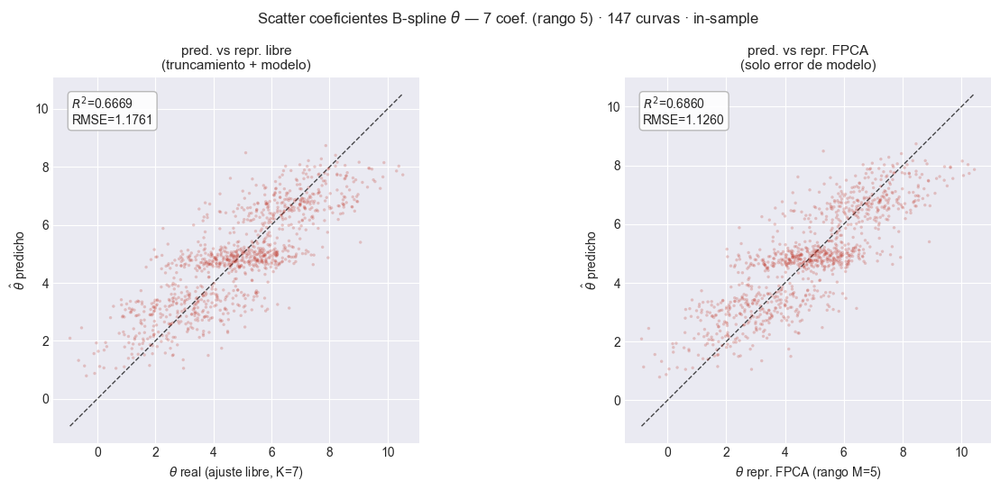

── Scatter θ agrupado (in-sample) ──────────────────────────────────
  vs $\theta$ real (ajuste libre, K=7)       R²=+0.6669  RMSE=1.176108
  vs $\theta$ repr. FPCA (rango M=5)         R²=+0.6860  RMSE=1.125980


In [21]:
# ── Scatter agrupado en espacio de COEFICIENTES B-spline (θ) — in-sample ─────
#   Izq.  θ̂_pred  vs  θ_real (ajuste B-spline LIBRE, rango K)
#         → la desviación mezcla truncamiento FPCA (K→M) + error de modelo.
#   Der.  θ̂_pred  vs  θ_repr (representación FPCA de los reales, rango M)
#         → ambos de rango M ⇒ la desviación es SOLO error del modelo PSBP.
if fpca_available and fr is not None:
    THETA_real_free = THETA[n_lags:]                    # (T_eff, K) ajuste libre
    THETA_repr_fpca = scores_to_theta(SCORES[n_lags:])  # (T_eff, K) repr. FPCA reales
    THETA_pred      = scores_to_theta(SCORES_pred_eff)  # (T_eff, K) predicción (== THETA_pred_eff)

    def _r2_rmse(x, y):
        x, y = x.ravel(), y.ravel()
        rmse   = float(np.sqrt(np.mean((y - x) ** 2)))
        ss_res = np.sum((y - x) ** 2); ss_tot = np.sum((x - x.mean()) ** 2)
        r2     = 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan
        return r2, rmse

    pairs = [
        (THETA_real_free, THETA_pred, rf"$\theta$ real (ajuste libre, K={THETA.shape[1]})",
         "pred. vs repr. libre\n(truncamiento + modelo)"),
        (THETA_repr_fpca, THETA_pred, rf"$\theta$ repr. FPCA (rango M={M_fpca})",
         "pred. vs repr. FPCA\n(solo error de modelo)"),
    ]

    fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))
    for ax, (x, y, xlabel, subtitle) in zip(axes, pairs):
        lo, hi = min(x.min(), y.min()), max(x.max(), y.max())
        ax.plot([lo, hi], [lo, hi], "k--", lw=1, alpha=0.7, zorder=1)
        ax.scatter(x.ravel(), y.ravel(), s=6, alpha=0.25,
                   color="#c0392b", edgecolors="none", zorder=2)
        r2, rmse = _r2_rmse(x, y)
        ax.set_title(subtitle, fontsize=11)
        ax.set_xlabel(xlabel); ax.set_ylabel(r"$\hat\theta$ predicho")
        ax.text(0.05, 0.95, f"$R^2$={r2:.4f}\nRMSE={rmse:.4f}",
                transform=ax.transAxes, va="top",
                bbox=dict(boxstyle="round", fc="white", ec="0.7", alpha=0.9))
        ax.set_aspect("equal", adjustable="box")

    fig.suptitle(
        rf"Scatter coeficientes B-spline $\theta$ — {THETA_pred.shape[1]} coef. "
        rf"(rango {M_fpca}) · {THETA_pred.shape[0]} curvas · in-sample",
        fontsize=12,
    )
    fig.tight_layout()
    fig.savefig(PATHS["out_report"] / "23_scatter_theta_coef.png",
                dpi=150, bbox_inches="tight")
    plt.show()

    print("── Scatter θ agrupado (in-sample) ──────────────────────────────────")
    for x, y, xlabel, _ in pairs:
        r2, rmse = _r2_rmse(x, y)
        print(f"  vs {xlabel:38s}  R²={r2:+.4f}  RMSE={rmse:.6f}")
else:
    print("⚠ fpca_available=False o fr=None — omitiendo scatter de coeficientes.")

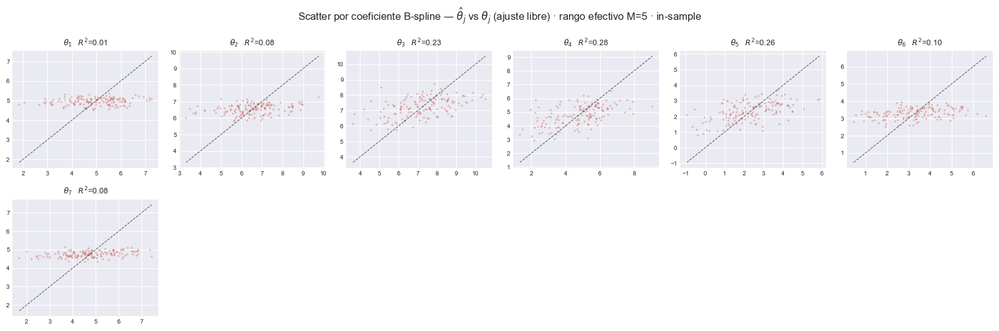

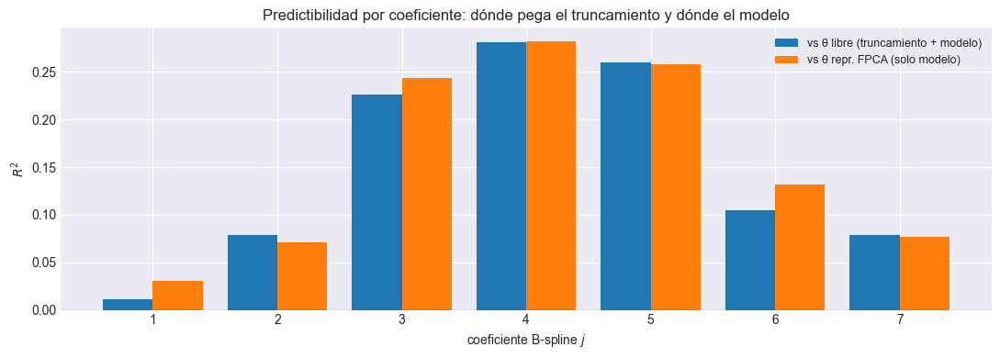

In [22]:
# ── Scatter POR COEFICIENTE B-spline: θ_j real vs θ_j predicho ───────────────
# θ̂ proviene de la proyección FPCA predicha, des-estandarizada y llevada a
# coeficientes vía θ̂ = μ_θ + ξ̂ Bᵀ (rango M). Los coeficientes cuyo contenido
# vive fuera de las primeras M componentes tendrán R² bajo o negativo contra
# el ajuste libre SIN que el PSBP tenga culpa: eso lo separa la figura 25.
if fpca_available and fr is not None:
    THETA_real_eff = THETA_real_free                        # (T_eff, K)
    K_b  = THETA_real_eff.shape[1]
    ncol = 6
    nrow = int(np.ceil(K_b / ncol))

    def _r2(x, y):
        ss_res = np.sum((y - x) ** 2); ss_tot = np.sum((x - x.mean()) ** 2)
        return 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan

    r2_vs_libre = np.array([_r2(THETA_real_eff[:, j], THETA_pred[:, j]) for j in range(K_b)])
    r2_vs_repr  = np.array([_r2(THETA_repr_fpca[:, j], THETA_pred[:, j]) for j in range(K_b)])

    fig, axes = plt.subplots(nrow, ncol, figsize=(2.7 * ncol, 2.7 * nrow))
    for j, ax in enumerate(np.ravel(axes)):
        if j >= K_b:
            ax.axis("off"); continue
        x, y = THETA_real_eff[:, j], THETA_pred[:, j]
        lo, hi = min(x.min(), y.min()), max(x.max(), y.max())
        ax.plot([lo, hi], [lo, hi], "k--", lw=0.8, alpha=0.6)
        ax.scatter(x, y, s=5, alpha=0.30, color="#c0392b", edgecolors="none")
        ax.set_title(rf"$\theta_{{{j+1}}}$   $R^2$={r2_vs_libre[j]:.2f}", fontsize=9)
        ax.tick_params(labelsize=7)
    fig.suptitle(rf"Scatter por coeficiente B-spline — $\hat\theta_j$ vs $\theta_j$ "
                 rf"(ajuste libre) · rango efectivo M={M_fpca} · in-sample", fontsize=12)
    fig.tight_layout()
    fig.savefig(PATHS["out_report"] / "24_scatter_theta_por_coef.png",
                dpi=150, bbox_inches="tight")
    plt.show()

    # ── Resumen: R² por coeficiente contra ambas referencias ─────────────────
    fig2, ax2 = plt.subplots(figsize=(11, 4))
    jj = np.arange(1, K_b + 1)
    ax2.bar(jj - 0.2, r2_vs_libre, width=0.4, label="vs θ libre (truncamiento + modelo)")
    ax2.bar(jj + 0.2, r2_vs_repr,  width=0.4, label="vs θ repr. FPCA (solo modelo)")
    ax2.axhline(0, color="k", lw=0.8)
    ax2.set_xlabel("coeficiente B-spline $j$"); ax2.set_ylabel("$R^2$")
    ax2.set_title("Predictibilidad por coeficiente: dónde pega el truncamiento y dónde el modelo")
    ax2.legend(fontsize=9)
    fig2.tight_layout()
    fig2.savefig(PATHS["out_report"] / "25_r2_por_coeficiente.png",
                 dpi=150, bbox_inches="tight")
    plt.show()
else:
    print("⚠ fpca_available=False o fr=None — omitiendo scatter por coeficiente.")

### 5.6 Bandas de credibilidad predictivas (aproximación ±1.96σ)

Serie temporal de cada score con su banda, y curvas funcionales con banda
propagada. La varianza de la curva en cada $\tau$ se propaga desde las
desviaciones predictivas de los scores (des-estandarizadas) usando la
independencia condicional entre componentes:
$\mathrm{Var}[\hat X_t(\tau)] = \sum_m \sigma_{t,m}^2\, \psi_m(\tau)^2$.

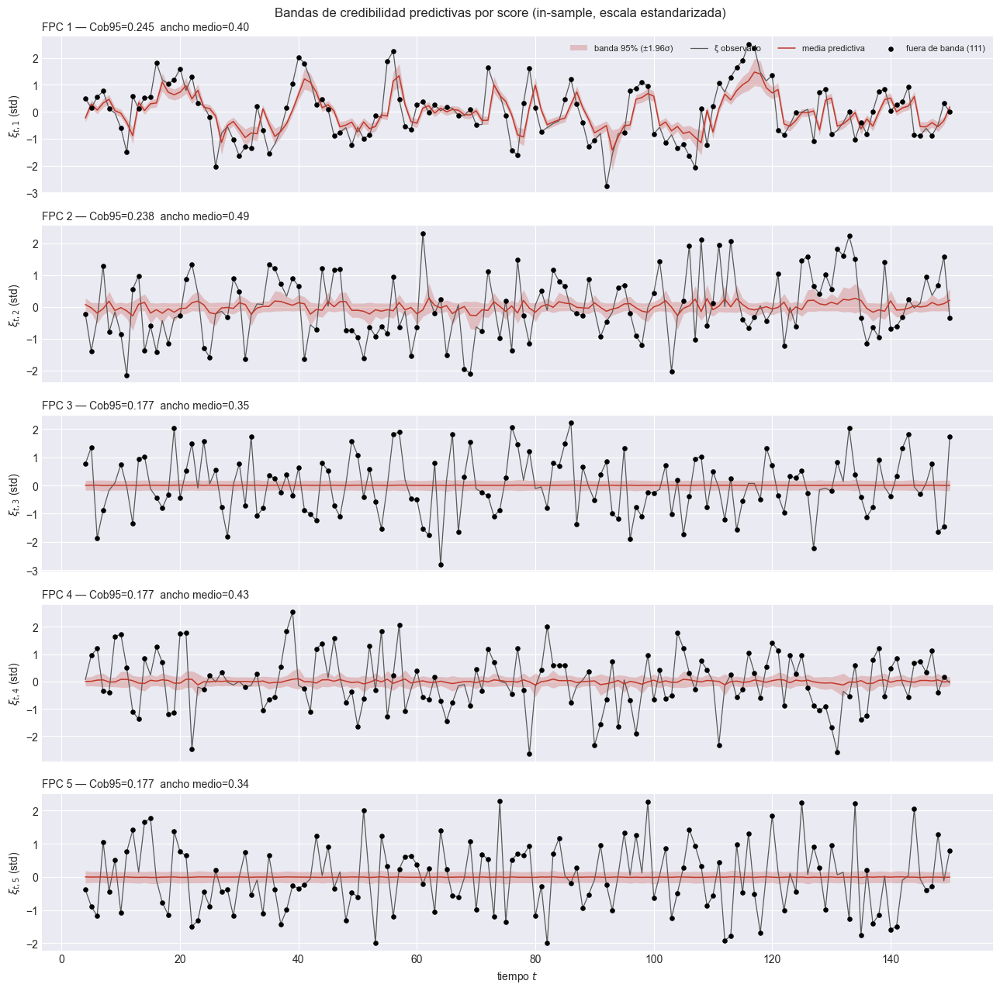

In [23]:
# ── Bandas por score: serie observada vs media predictiva ± 1.96σ ────────────
fig, axes = plt.subplots(n_components, 1, figsize=(13, 2.6 * n_components),
                         sharex=True)
axes = np.atleast_1d(axes)
tt_eff = np.arange(n_lags + 1, n_lags + 1 + len(eval_results[0]["y_obs"]))

for k, ax in zip(sorted(models_chains), axes):
    r = eval_results[k]
    ax.fill_between(tt_eff, r["y_hat"] - 1.96 * r["y_std"],
                    r["y_hat"] + 1.96 * r["y_std"],
                    alpha=0.25, color="#c0392b", lw=0,
                    label="banda 95% (±1.96σ)")
    ax.plot(tt_eff, r["y_obs"], color="0.35", lw=0.9, label="ξ observado")
    ax.plot(tt_eff, r["y_hat"], color="#c0392b", lw=1.1, label="media predictiva")
    fuera = np.abs(r["y_obs"] - r["y_hat"]) > 1.96 * r["y_std"]
    ax.scatter(tt_eff[fuera], r["y_obs"][fuera], s=14, color="k", zorder=3,
               label=f"fuera de banda ({fuera.sum()})")
    ax.set_ylabel(rf"$\xi_{{t,{COMPONENT_IDX[k]+1}}}$ (std)")
    ax.set_title(f"FPC {COMPONENT_IDX[k]+1} — Cob95={r['cov95']:.3f}  "
                 f"ancho medio={r['ancho95']:.2f}", fontsize=10, loc="left")
    if k == sorted(models_chains)[0]:
        ax.legend(fontsize=8, ncol=4, loc="upper right")
axes[-1].set_xlabel("tiempo $t$")
fig.suptitle("Bandas de credibilidad predictivas por score (in-sample, escala estandarizada)",
             fontsize=12)
fig.tight_layout()
fig.savefig(PATHS["out_report"] / "26_bandas_scores.png", dpi=150, bbox_inches="tight")
plt.show()

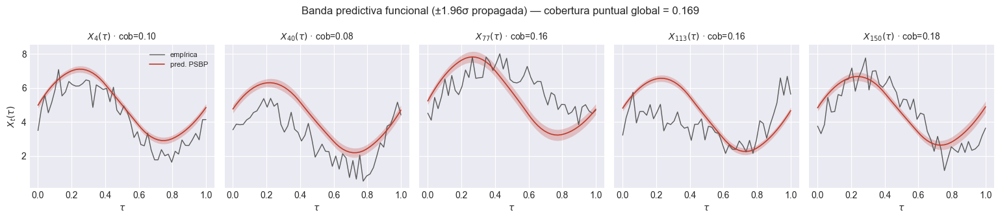

Cobertura funcional puntual (in-sample, nominal 0.95): 0.1688


In [24]:
# ── Banda funcional: snapshots de curvas con banda propagada ─────────────────
if fpca_available and fr is not None:
    # Desv. predictiva por score en ESCALA ORIGINAL: σ_orig = σ_std · sd_m
    SD_pred_eff = np.zeros_like(SCORES_pred_eff)             # (T_eff, M)
    for k, idx in enumerate(COMPONENT_IDX):
        SD_pred_eff[:, idx] = eval_results[k]["y_std"] * scores_standardizer.std[idx]

    # Var de la curva: independencia condicional entre scores ⇒ suma ponderada
    VAR_curva = SD_pred_eff ** 2 @ (Psi_grid.T ** 2)         # (T_eff, G)
    SD_curva  = np.sqrt(VAR_curva)

    n_snap  = 5
    idx_sel = np.linspace(0, X_true_eff.shape[0] - 1, n_snap).astype(int)
    fig, axes = plt.subplots(1, n_snap, figsize=(3.1 * n_snap, 3.4), sharey=True)
    for ax, i in zip(axes, idx_sel):
        ax.fill_between(domain_grid,
                        X_fpca_pred[i] - 1.96 * SD_curva[i],
                        X_fpca_pred[i] + 1.96 * SD_curva[i],
                        alpha=0.25, color="#c0392b", lw=0)
        ax.plot(domain_grid, X_true_eff[i],  color="0.35", lw=1.0, label="empírica")
        ax.plot(domain_grid, X_fpca_pred[i], color="#c0392b", lw=1.2, label="pred. PSBP")
        cob_i = float(np.mean(np.abs(X_true_eff[i] - X_fpca_pred[i])
                              <= 1.96 * SD_curva[i]))
        ax.set_title(rf"$X_{{{n_lags + 1 + i}}}(\tau)$ · cob={cob_i:.2f}", fontsize=10)
        ax.set_xlabel(r"$\tau$")
    axes[0].set_ylabel(r"$X_t(\tau)$")
    axes[0].legend(fontsize=8)

    # Cobertura funcional puntual global (promedio sobre t y τ)
    cob_fun = float(np.mean(np.abs(X_true_eff - X_fpca_pred) <= 1.96 * SD_curva))
    fig.suptitle(f"Banda predictiva funcional (±1.96σ propagada) — "
                 f"cobertura puntual global = {cob_fun:.3f}", fontsize=12)
    fig.tight_layout()
    fig.savefig(PATHS["out_report"] / "27_banda_funcional_snapshots.png",
                dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Cobertura funcional puntual (in-sample, nominal 0.95): {cob_fun:.4f}")
else:
    print("⚠ fpca_available=False o fr=None — omitiendo banda funcional.")

### 5.7 Métricas resumen (in-sample)

Con los scores **estandarizados** (var = 1 por componente), los RMSE son
directamente comparables entre componentes — un RMSE de 1 equivale al
predictor trivial $\hat\xi = 0$. Cob95 debe leerse contra el nominal 0.95
recordando que la banda es la aproximación de dos momentos.

In [25]:
# ── Tabla de métricas por componente + persistencia ──────────────────────
rows = []
for k in models_chains:
    r = eval_results[k]
    ss_res = np.sum((r["y_obs"] - r["y_hat"]) ** 2)
    ss_tot = np.sum((r["y_obs"] - r["y_obs"].mean()) ** 2)
    r2     = 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan
    corr   = np.corrcoef(r["y_obs"], r["y_hat"])[0, 1]
    rows.append({
        "FPC":     f"FPC {COMPONENT_IDX[k]+1}",
        "RMSE":    r["rmse"],
        "R²":      r2,
        "Corr":    corr,
        "sd(ŷ)/sd(y)": float(r["y_hat"].std(ddof=0) / r["y_obs"].std(ddof=0)),
        "Cob95":   r["cov95"],
        "Ancho95": r["ancho95"],
        "T_eff":   len(r["y_obs"]),
    })

metrics_df = pd.DataFrame(rows).set_index("FPC")

# Persistencia: tabla fuente para el capítulo de resultados
metrics_df.to_csv(PATHS["out_report"] / "31_metricas_por_componente.csv")
print(f"[out_report] 31_metricas_por_componente.csv")

display(
    metrics_df.style
    .format({"RMSE": "{:.6f}", "R²": "{:.4f}", "Corr": "{:.4f}",
             "sd(ŷ)/sd(y)": "{:.3f}", "Cob95": "{:.3f}", "Ancho95": "{:.3f}"})
    .background_gradient(subset=["RMSE"],  cmap="RdYlGn_r")
    .background_gradient(subset=["R²"],    cmap="RdYlGn",   vmin=0,    vmax=1)
    .background_gradient(subset=["Cob95"], cmap="RdYlGn",   vmin=0.80, vmax=1.0)
    .set_caption("Métricas predictivas por componente FPCA (in-sample)")
)

[out_report] 31_metricas_por_componente.csv


,RMSE,R²,Corr,sd(ŷ)/sd(y),Cob95,Ancho95,T_eff
FPC,,,,,,,
FPC 1,0.757061,0.4279,0.6566,0.600,0.245,0.402,147
FPC 2,0.963827,0.0413,0.2195,0.137,0.238,0.493,147
FPC 3,1.009010,0.0007,0.1118,0.003,0.177,0.354,147
FPC 4,0.994589,0.0149,0.1762,0.049,0.177,0.434,147
FPC 5,0.979583,0.0006,0.0750,0.004,0.177,0.342,147
